#What`s Cooking?
*Use recipe ingredients to categorize the cuisine*

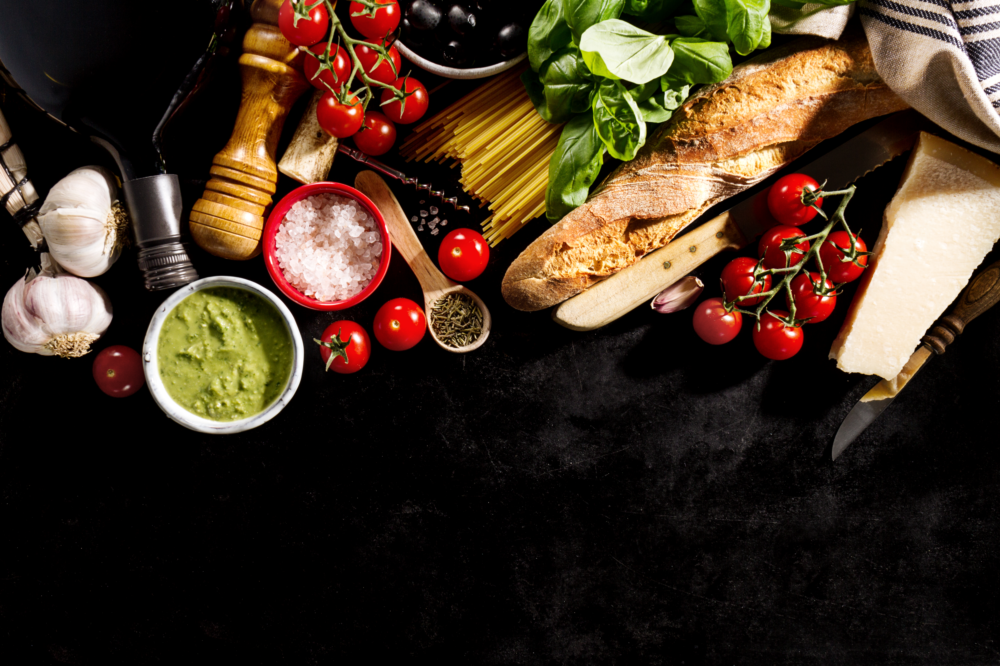

# Загрузка данных

Загрузка модулей:
 
* Библиотека catboost для построения модели
* pandas для работы с данными
* matplotlib и seaborn для визуализации 
* Counter и re для дополнительных вычислений
* sklearn train_test_split для разделения данных на тестовую и валидационную выборки, CountVectorizer для получения эмбеддинга слов




In [1]:
!pip install -q catboost

     |████████████████████████████████| 69.2MB 40kB/s 


In [2]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from collections import Counter
import re

import catboost

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer

Модуль nltk для обработки слов

In [3]:
import nltk
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt')
nltk.download('universal_tagset')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Unzipping taggers/universal_tagset.zip.


True

Установка стиля графика

In [4]:
sns.set(style='whitegrid')

Подключение диска для загрузки файлов

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
train_df = pd.read_json('/content/drive/MyDrive/Final_Project/train.json')
test_df = pd.read_json('/content/drive/MyDrive/Final_Project/test.json')

Внешний вид данных:

In [7]:
train_df.head()

,id,cuisine,ingredients
0,10259,greek,"[romaine lettuce, black olives, grape tomatoes..."
1,25693,southern_us,"[plain flour, ground pepper, salt, tomatoes, g..."
2,20130,filipino,"[eggs, pepper, salt, mayonaise, cooking oil, g..."
3,22213,indian,"[water, vegetable oil, wheat, salt]"
4,13162,indian,"[black pepper, shallots, cornflour, cayenne pe..."


In [8]:
test_df.head()

,id,ingredients
0,18009,"[baking powder, eggs, all-purpose flour, raisi..."
1,28583,"[sugar, egg yolks, corn starch, cream of tarta..."
2,41580,"[sausage links, fennel bulb, fronds, olive oil..."
3,29752,"[meat cuts, file powder, smoked sausage, okra,..."
4,35687,"[ground black pepper, salt, sausage casings, l..."


In [9]:
train_df.shape

(39774, 3)

In [10]:
test_df.shape

(9944, 2)



---



# Анализ данных

Распределение количества рецептов для каждой кухни:

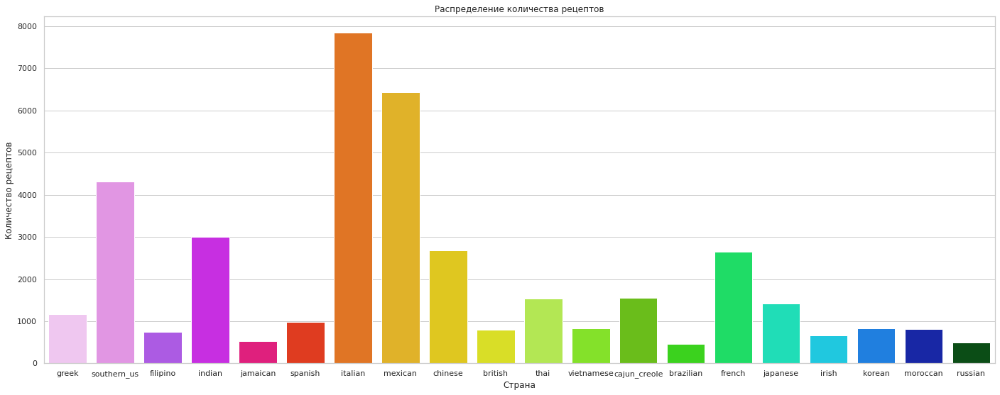

In [11]:
plt.figure(figsize=(24,9))
plt.title('Распределение количества рецептов')
sns.countplot(data=train_df, x='cuisine', palette='gist_ncar_r')
plt.ylabel('Количество рецептов')
plt.xlabel('Страна')
plt.savefig('recipes_countries.png')

*Больше всего рецептов - это рецепты итальянской и мексиканской кухни, меньше всего рецептов из Бразилии, России и Ямайки*


---



Распределение количества ингредиентов в рецепте:

In [12]:
train_df['ingredients_count'] = train_df['ingredients'].str.len()

In [13]:
test_df['ingredients_count'] = test_df['ingredients'].str.len()

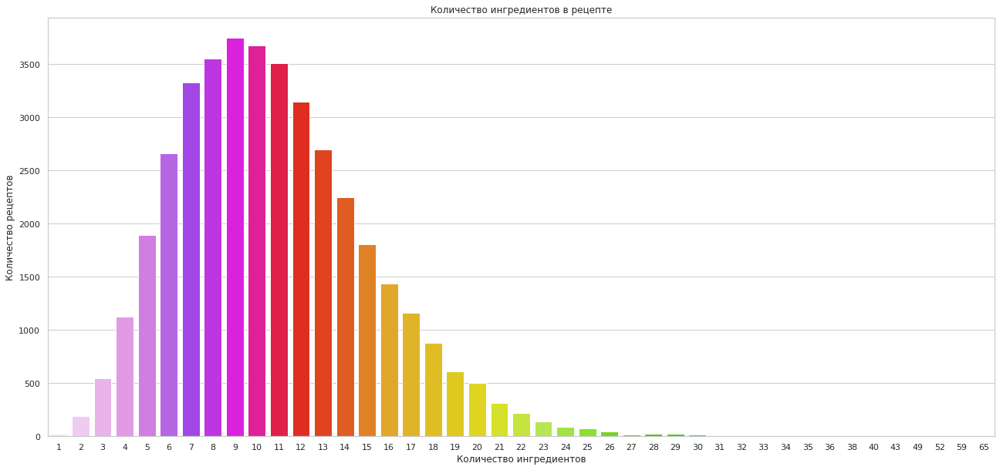

In [14]:
plt.figure(figsize=(22,10))
plt.title('Количество ингредиентов в рецепте')
sns.countplot(data=train_df, x='ingredients_count', palette='gist_ncar_r')
plt.ylabel('Количество рецептов')
plt.xlabel('Количество ингредиентов')
plt.savefig('ingredients_recipes.png')

*Большая часть рецептов состоит из количества ингредиентов между 6 и 14, но также есть какие-то странные рецепты из 1 или, наоборот, 65 ингредиентов.*

Рецепты из одного ингредиента в обучающей и тестовой выборках:

In [15]:
train_df[train_df['ingredients_count'] == 1]

,id,cuisine,ingredients,ingredients_count
940,4734,japanese,[sushi rice],1
2088,7833,vietnamese,[dried rice noodles],1
6787,36818,indian,[plain low-fat yogurt],1
7011,19772,indian,[unsalted butter],1
8181,16116,japanese,[udon],1
8852,29738,thai,[sticky rice],1
8990,41124,indian,[butter],1
10506,32631,mexican,[corn tortillas],1
13178,29570,thai,[grained],1
17804,29849,southern_us,[lemonade concentrate],1


In [16]:
test_df[test_df['ingredients_count'] == 1]

,id,ingredients,ingredients_count
544,36822,[plain low-fat yogurt],1
3248,34002,[glutinous rice],1
3444,28414,[pimentos],1
3621,10077,[sweetened condensed milk],1
4021,32883,[unsalted butter],1
7417,45798,[chiles],1
8081,45398,[parmesan cheese],1
9407,32743,[shiitake],1


Рецепты с большим количеством ингредиентов:

In [17]:
train_df[train_df['ingredients_count'] > 40]

,id,cuisine,ingredients,ingredients_count
10513,49282,mexican,"[condensed cream of chicken soup, pepper, refr...",49
15289,3885,italian,"[fettucine, fresh marjoram, minced garlic, oli...",65
22906,2253,indian,"[white vinegar, sparkling lemonade, coconut su...",49
26103,13049,mexican,"[vanilla ice cream, lime, garlic powder, zucch...",52
30350,13430,brazilian,"[marshmallows, fresh corn, cheddar cheese, shr...",59
31250,29216,italian,"[eggs, warm water, pepper, dried basil, unsalt...",43


In [18]:
test_df[test_df['ingredients_count'] > 40]

,id,ingredients,ingredients_count
4338,39167,"[pico de gallo, slaw, orange, coriander seeds,...",41
4809,526,"[diced onions, yellow mustard seeds, chili pep...",50


*Видно, что среди рецептов из одного ингредиента есть повторения, поэтому надо отбросить повторы. Также видно, что эти рецепты присутствуют и в тестовых данных, поэтому не стоит их отбрасывать.* 

*Но для рецептов с большой длиной соответствие между тестовыми и обучающими данными не наблюдается, поэтому самые крайние рецепты из обучающей выборки можно отбросить для исключения переобучения.*

Для начала переведем ингредиенты в вид строки для удобства, затем удалим повторы:

In [19]:
train_df['ingredients_in_string'] = train_df['ingredients'].apply(','.join)

In [20]:
train_df.drop_duplicates(inplace=True, subset=['ingredients_in_string'])

Оставим только рецепты с количеством ингредиентов меньше 55:

In [21]:
train_df = train_df[train_df['ingredients_count'] < 55]

In [22]:
train_df.shape

(39672, 5)



---



Сатистические характеристики данных:

In [23]:
train_df['ingredients_count'].describe()

count    39672.000000
mean        10.769888
std          4.412139
min          1.000000
25%          8.000000
50%         10.000000
75%         13.000000
max         52.000000
Name: ingredients_count, dtype: float64

In [24]:
test_df['ingredients_count'].describe()

count    9944.000000
mean       10.799980
std         4.467154
min         1.000000
25%         8.000000
50%        10.000000
75%        13.000000
max        50.000000
Name: ingredients_count, dtype: float64

Распределения не отличаются на тестовой и обучающей выборке.



---

Распределение среднего количества ингредиентов в рецепте по странам:

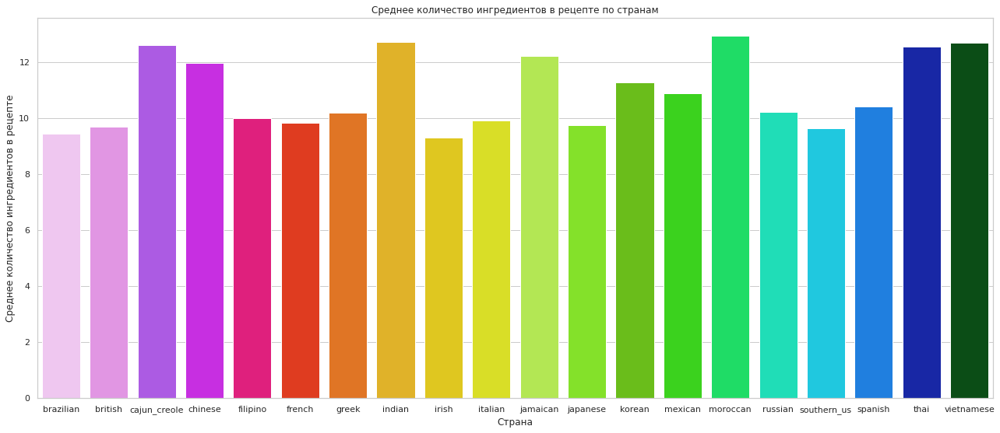

In [25]:
mean_df = train_df.groupby(['cuisine']).mean()
mean_df.reset_index(inplace=True)
plt.figure(figsize=(22,9))
plt.title('Среднее количество ингредиентов в рецепте по странам')
sns.barplot(x='cuisine', y='ingredients_count', data=mean_df, palette='gist_ncar_r')
plt.ylabel('Среднее количество ингредиентов в рецепте')
plt.xlabel('Страна')
plt.savefig('mean_ingredients.png')

*По графику видно, что какой-то особо выделяющейся страны в данном признаке нет.*


---

Распределение количества ингредиентов в рецепте в зависимости от страны:

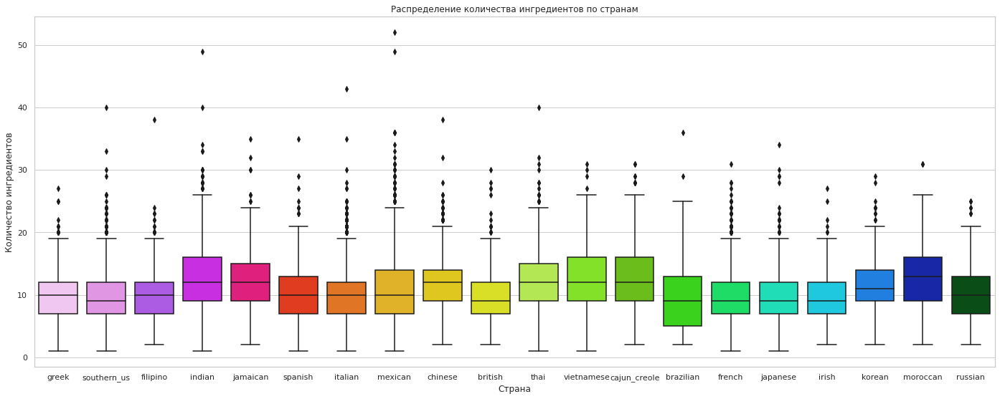

In [26]:
plt.figure(figsize=(24,9))
plt.title('Распределение количества ингредиентов по странам')
sns.boxplot(x='cuisine', y='ingredients_count', data=train_df, palette='gist_ncar_r')
plt.ylabel('Количество ингредиентов')
plt.xlabel('Страна')
plt.savefig('ingredients_countries.png')

*В данных остались выбросы, но они характерны и для тестовой выборки, поэтому должны остаться. Также видно, что выбросы характерны не для каких-то конкретных стран, а они присутствуют в рецептах каждой страны.*



---

Самые популярные и самые редко встречающиеся ингредиенты:

In [27]:
ingredients_counter = Counter()

In [28]:
for recipe in train_df['ingredients']:
  for ingredient in recipe:
    ingredients_counter[ingredient] += 1

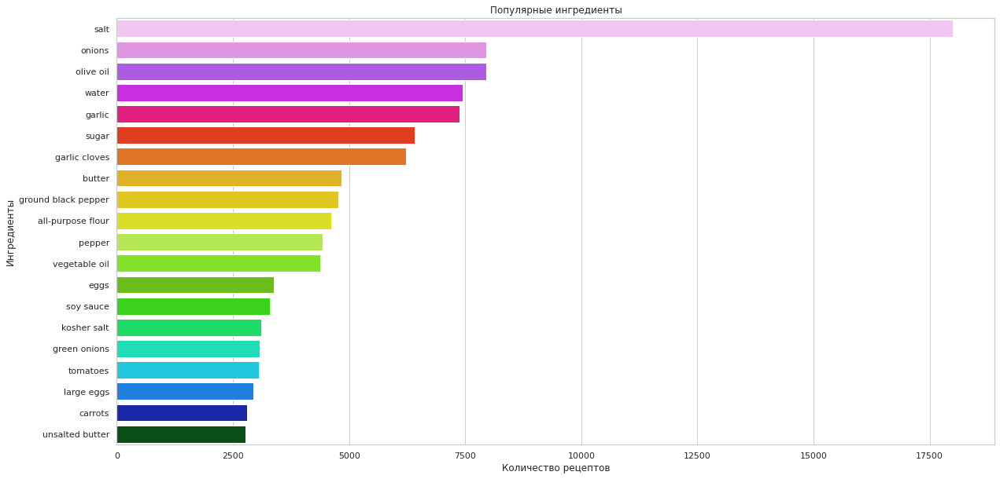

In [29]:
popular_ingredients = pd.DataFrame(ingredients_counter.most_common(20))
popular_ingredients.columns = ['ingredients','total_count']
plt.figure(figsize=(20,10))
plt.title('Популярные ингредиенты')
sns.barplot(x='total_count', y='ingredients', data=popular_ingredients, palette='gist_ncar_r')
plt.ylabel('Ингредиенты')
plt.xlabel('Количество рецептов')
plt.savefig('popular_ingredients.png')

*Самый часто встречающийся ингредиент - это соль. Соль появляется все равно меньше, чем в половине рецептов, поэтому не стоит ее отбрасывать.* 

Самые редко встречающиеся ингредиенты:

In [30]:
ingredients_counter.most_common()[:-31:-1]

[('crushed cheese crackers', 1),
 ('tomato garlic pasta sauce', 1),
 ('lop chong', 1),
 ('Hidden Valley® Greek Yogurt Original Ranch® Dip Mix', 1),
 ('Lipton® Iced Tea Brew Family Size Tea Bags', 1),
 ('ciabatta loaf', 1),
 ('cholesterol free egg substitute', 1),
 ('orange glaze', 1),
 ('Challenge Butter', 1),
 ('Oscar Mayer Cotto Salami', 1),
 ('Kraft Slim Cut Mozzarella Cheese Slices', 1),
 ('curry mix', 1),
 ('Daiya', 1),
 ('tongue', 1),
 ('game', 1),
 ('rotini pasta, cook and drain', 1),
 ('chocolate flavored liqueur', 1),
 ('ketjap', 1),
 ('ranch-style seasoning', 1),
 ('whole wheat peasant bread', 1),
 ('reduced sodium ham', 1),
 ('whole grain baguette', 1),
 ('knorr pasta side   cheesi cheddar', 1),
 ('Makers Mark Whisky', 1),
 ('2% milk shredded mozzarella cheese', 1),
 ('conchiglie', 1),
 ('light chicken stock', 1),
 ('turkey giblet stock', 1),
 ('Barilla Plus Pasta', 1),
 ('puff paste', 1)]

*Даже по этой небольшой выборке видно, что в данных часто встречаются дополнительные символы (например, ®) и цифры, а также некоторые ингредиенты имеют довольно длинное название*



---
Самые популярные 5 ингредиентов для каждой кухни отдельно:


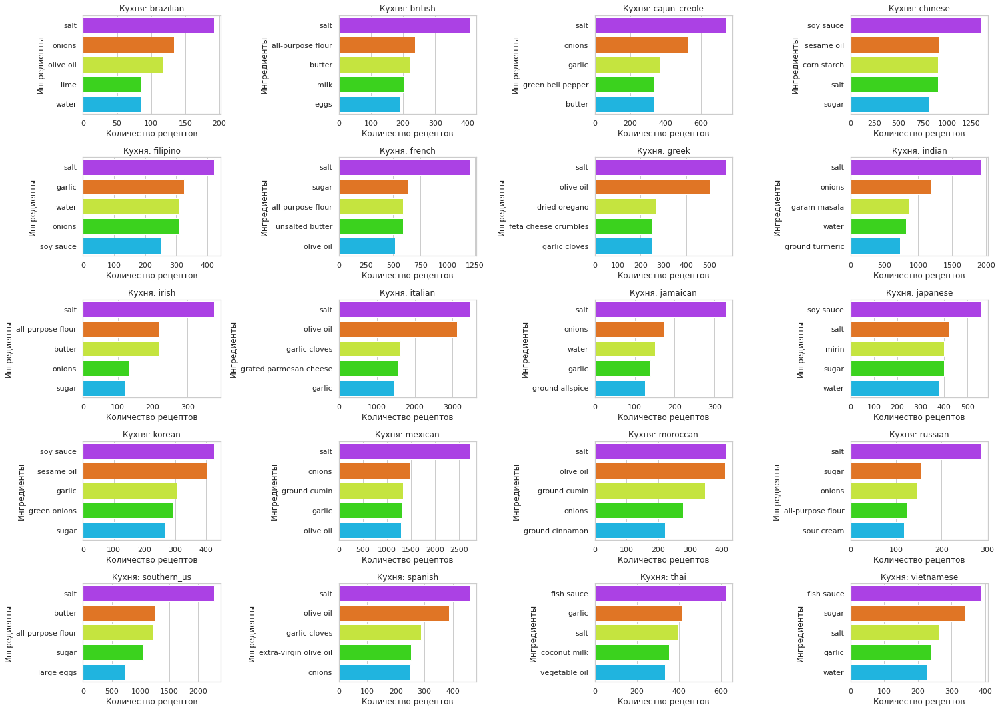

In [31]:
plt.figure(figsize=(21,15))
for i, cuisine in enumerate(train_df.groupby(['cuisine'])):
  cuisine_counter = Counter()
  for recipe in cuisine[1]['ingredients']:
    for ingredient in recipe:
      cuisine_counter[ingredient] += 1
  popular = pd.DataFrame(cuisine_counter.most_common(5))
  popular.columns = ['ingredients','total_count']
  plt.subplot(5, 4, i+1)
  plt.title('Кухня: ' + cuisine[0])
  sns.barplot(x='total_count', y='ingredients', data=popular, palette='gist_ncar_r')
  plt.ylabel('Ингредиенты')
  plt.xlabel('Количество рецептов')
plt.tight_layout()
plt.savefig('popular_ingredients_by_cuisine.png')

Можно предположить, что наиболее значимое влияние на предсказание окажут такие ингредиенты:
* salt
* fish sauce
* soy sauce


Видно, что соль хоть и оказывает влияние на большинство рецептов, для некоторых стран (Вьетнам, Корея, Китай) большее значение имеют другие ингредиенты.


---



# Подготовка данных

По выводам выше видно, что из данных нужно удалить дополнительные символы, привести к строчным буквам, удалить единицы измерения и лишние пробелы и из длинных словосочетаний оставить только наиболее важные слова (существительные). Для этого используются регулярные выражения и бибилиотека nltk.

In [32]:
def shorten_word_seq(word_seq):
    text = nltk.word_tokenize(word_seq)
    words_with_classes = nltk.pos_tag(text,tagset='universal')
    nouns = []
    for i in words_with_classes:
        if i[1] == 'NOUN':
            nouns.append(i[0])
    return ' '.join(nouns)

In [33]:
def clear_ingredients(list):
  clean_ingredients = []
  for line in list:
    recipe = []
    for word_seq in line:
      word_seq = word_seq.lower()
      word_seq = re.sub(r'\d',' ',word_seq)
      word_seq = re.sub(r'\b(oz|ounce|pound|lb|inch|inches|kg)\b',' ',word_seq)
      word_list = []
      count = 0
      for word in word_seq.split(' '):
        word = re.sub(r'\W',' ',word)
        word_list.append(word)
        count = count + 1
      word_seq = ' '.join(word_list)
      word_seq = re.sub(r'\s\s+','',word_seq)
      if count > 2:
        word_seq = shorten_word_seq(word_seq)
      recipe.append(word_seq)
    clean_ingredients.append(recipe)
  return clean_ingredients

In [34]:
ingredients_train = clear_ingredients(train_df['ingredients'])

In [35]:
ingredients_test = clear_ingredients(test_df['ingredients'])



---



# Подготовка датасета (CountVectorizer)

Для использования CountVectorizer нужно изменить параметр токенизации, т.к. по умолчанию токенизация происходит по пробелам, а для сохранения словосочетаний нужно использовать токенизацию по запятым.

В ходе экспериментов было выяснено, что модель лучше работает при выборе параметра max_features равным 2000, потому что при меньшем значении теряется полнота словаря, а при большем учитываются незначительные признаки.

In [36]:
count_vectorizer = CountVectorizer(max_features=2000, token_pattern=r'(?u)[a-zA-Z][a-z ]+', lowercase=False)
features_train = count_vectorizer.fit_transform([str(x) for x in ingredients_train])
features_test = count_vectorizer.transform([str(x) for x in ingredients_test])

С помощью метода toarray() получаются эмбеддинги рецептов, где для каждого ингредиента 1 ставится в случае его присутствия в рецепте и 0, если ингредиента нет.

In [37]:
train_features = pd.DataFrame(features_train.toarray(), columns=count_vectorizer.get_feature_names())

In [38]:
test_features = pd.DataFrame(features_test.toarray(), columns=count_vectorizer.get_feature_names())

Далее данные разделяются на тестовую (80%) и валидационную (20%) выборки.

In [39]:
X_train, X_val, y_train, y_val = train_test_split(train_features, train_df['cuisine'], train_size=0.8, random_state=42)
X_train.shape, X_val.shape

((31737, 2000), (7935, 2000))

In [40]:
X_test = test_features



---



# Обучение модели (CatBoostClassifier)

Для обучения выбрана модель **CatBoostClassifier**, потому что целевая переменная представлена в категориальном виде. Помимо этого библиотека **catboost** имеет возможность обучения на GPU, что заметно сокращает время обучения для достаточно больших данных. Также используется много итераций для улучшения качества модели.

In [41]:
train_pool = catboost.Pool(
    X_train,
    label=y_train
)
val_pool = catboost.Pool(
    X_val,
    label=y_val
)

In [42]:
model = catboost.CatBoostClassifier(
    iterations=15000,
    loss_function='MultiClass',
    use_best_model=True,
    task_type='GPU',
    random_seed=42
)

In [43]:
model.fit(train_pool, eval_set=val_pool, verbose=False)

KeyboardInterrupt: ignored



---


После обучения можно получить предсказания для тестовой выборки и записать их в файл *submission.csv:*

In [ ]:
test_pool = catboost.Pool(
    X_test
)

In [ ]:
predicted = model.predict(X_test)

In [ ]:
predicted

In [ ]:
result_df = pd.DataFrame()
result_df['id'] = test_df['id']
result_df['cuisine'] = predicted
result_df.to_csv(path_or_buf='./submission.csv', index=False)

После обучения модели можно посмотреть на признаки, которые оказывают наибольшее влияние на предсказание:

In [ ]:
feature_importances = pd.DataFrame(model.get_feature_importance(prettified=True)[:20])
feature_importances.columns = ['ingredient','importance']
plt.figure(figsize=(20,10))
plt.title('Feature importances')
sns.barplot(x='importance', y='ingredient', data=feature_importances, palette='gist_ncar_r')
plt.ylabel('Ингредиенты')
plt.xlabel('Важность')
plt.savefig('feature_importances.png')

Особое влияние на предсказание оказали такие ингредиенты:
* fish sauce
* soy sauce
* butter

Неожиданно в первой тройке оказалось масло, а не соль, как предполагалось выше.

